## 데이터 불러오기

In [55]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [21]:
# 데이터 중 몇 가지 빈 데이터가 있다면 error_bad_lines=False 를 통해
# 에러 데이터는 제외하고 변환하여 불러오는 기능
# index_col = "id"
books= pd.read_csv('data/books.csv', error_bad_lines=False)

C:\Users\User\AppData\Local\Temp\ipykernel_15392\4208723813.py:4: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  books= pd.read_csv('data/books.csv', error_bad_lines=False)


In [17]:
books.head()

,id,book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,...,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
0,1,2767052,2767052,2792775,272,439023483,9.780439e+12,Suzanne Collins,2008.0,The Hunger Games,...,4780653,4942365,155254,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603m...,https://images.gr-assets.com/books/1447303603s...
1,2,3,3,4640799,491,439554934,9.780440e+12,"J.K. Rowling, Mary GrandPré",1997.0,Harry Potter and the Philosopher's Stone,...,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m...,https://images.gr-assets.com/books/1474154022s...
2,3,41865,41865,3212258,226,316015849,9.780316e+12,Stephenie Meyer,2005.0,Twilight,...,3866839,3916824,95009,456191,436802,793319,875073,1355439,https://images.gr-assets.com/books/1361039443m...,https://images.gr-assets.com/books/1361039443s...
3,4,2657,2657,3275794,487,61120081,9.780061e+12,Harper Lee,1960.0,To Kill a Mockingbird,...,3198671,3340896,72586,60427,117415,446835,1001952,1714267,https://images.gr-assets.com/books/1361975680m...,https://images.gr-assets.com/books/1361975680s...
4,5,4671,4671,245494,1356,743273567,9.780743e+12,F. Scott Fitzgerald,1925.0,The Great Gatsby,...,2683664,2773745,51992,86236,197621,606158,936012,947718,https://images.gr-assets.com/books/1490528560m...,https://images.gr-assets.com/books/1490528560s...


In [19]:
books.shape

(10000, 23)

In [22]:
ratings = pd.read_csv('data/ratings.csv')

ratings.head()

,book_id,user_id,rating
0,1,314,5
1,1,439,3
2,1,588,5
3,1,1169,4
4,1,1185,4


In [24]:
tags = pd.read_csv('data/book_tags.csv')
tags.tail()

,goodreads_book_id,tag_id,count
999907,33288638,21303,7
999908,33288638,17271,7
999909,33288638,1126,7
999910,33288638,11478,7
999911,33288638,27939,7


In [26]:
btags = pd.read_csv('data/tags.csv')
btags.tail()

,tag_id,tag_name
34247,34247,Ｃhildrens
34248,34248,Ｆａｖｏｒｉｔｅｓ
34249,34249,Ｍａｎｇａ
34250,34250,ＳＥＲＩＥＳ
34251,34251,ｆａｖｏｕｒｉｔｅｓ


## 전처리

In [27]:
ratings=ratings.sort_values("user_id")
ratings.shape

(981756, 3)

In [28]:
# subset=None : 중복값을 검사할 열. 기본적으로 모든 열을 검사
# keep = 'first' : {first / last} 중복 제거를 할 때 남길 행
# first 면 첫 값을 남기고, last 면 마지막 값을 남긴다.
# inplace = False : 원본을 변경할지의 여부
# 4487 개의 duplicates 가 제거된다.

ratings.drop_duplicates(subset =["user_id","book_id"], 
                     keep = False, inplace = True) 
ratings.shape

(977269, 3)

In [29]:
print(books.shape)
books.drop_duplicates(subset='original_title',keep=False,inplace=True)
print(books.shape)

(10000, 23)
(9151, 23)


In [30]:
print(btags.shape)
btags.drop_duplicates(subset='tag_id',keep=False,inplace=True)
print(btags.shape)

(34252, 2)
(34252, 2)


In [31]:
print(tags.shape)
tags.drop_duplicates(subset=['tag_id','goodreads_book_id'],keep=False,inplace=True)
print(tags.shape)

(999912, 3)
(999896, 3)


## 시각화

In [34]:
# df_10 = df_top10.merge(df_krx, left_on="종목별", right on ="Name", 
#                        how="left")[["Name", "Symbol"]]
# joint_tags=tags.merge(btags,left_on='tag_id',right_on='tag_id',how='inner')

,goodreads_book_id,tag_id,count,tag_name
0,1,30574,167697,to-read
1,2,30574,24549,to-read
2,3,30574,496107,to-read
3,5,30574,11909,to-read
4,6,30574,298,to-read


In [32]:
# how 의 디폴트는 inner. 양쪽의 값이 같을 때 가져온다.
joint_tags=pd.merge(tags,btags,left_on='tag_id',right_on='tag_id',how='inner')

In [33]:
joint_tags.head()

,goodreads_book_id,tag_id,count,tag_name
0,1,30574,167697,to-read
1,2,30574,24549,to-read
2,3,30574,496107,to-read
3,5,30574,11909,to-read
4,6,30574,298,to-read


### top 10 rated books

In [39]:
top_rated=books.sort_values('average_rating', ascending=False)
top10=top_rated.head(10)
f=['title','small_image_url']
displ=(top10[f])
displ.set_index('title', inplace=True)

In [40]:
from IPython.display import Image, HTML

def path_to_image_html(path):
    '''
     This function essentially convert the image url to 
     '<img src="'+ path + '"/>' format. And one can put any
     formatting adjustments to control the height, aspect ratio, size etc.
     within as in the below example. 
    '''

    return '<img src="'+ path + '""/>'

HTML(displ.to_html(escape=False ,formatters=dict(small_image_url=path_to_image_html),justify='center'))

,small_image_url
title,
The Complete Calvin and Hobbes,
"Words of Radiance (The Stormlight Archive, #2)",
Mark of the Lion Trilogy,
It's a Magical World: A Calvin and Hobbes Collection,
There's Treasure Everywhere: A Calvin and Hobbes Collection,
"Harry Potter Boxset (Harry Potter, #1-7)",
"Harry Potter Collection (Harry Potter, #1-6)",
The Indispensable Calvin and Hobbes,
The Authoritative Calvin and Hobbes: A Calvin and Hobbes Treasury,


### top 10 most popular books

In [42]:
pop10=books.sort_values(by='ratings_count', ascending=False)
f=['title','small_image_url']
pop10=pop10.head(10)

pop10=(pop10[f])
pop10=pop10.set_index('title')

In [43]:
HTML(pop10.to_html(escape=False ,formatters=dict(small_image_url=path_to_image_html),justify='center'))

,small_image_url
title,
"The Hunger Games (The Hunger Games, #1)",
"Harry Potter and the Sorcerer's Stone (Harry Potter, #1)",
To Kill a Mockingbird,
The Great Gatsby,
The Fault in Our Stars,
The Hobbit,
The Catcher in the Rye,
Pride and Prejudice,
"Angels & Demons (Robert Langdon, #1)",


### Most Common Rating Values
- 3.5 와 4 사이가 most common rating

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

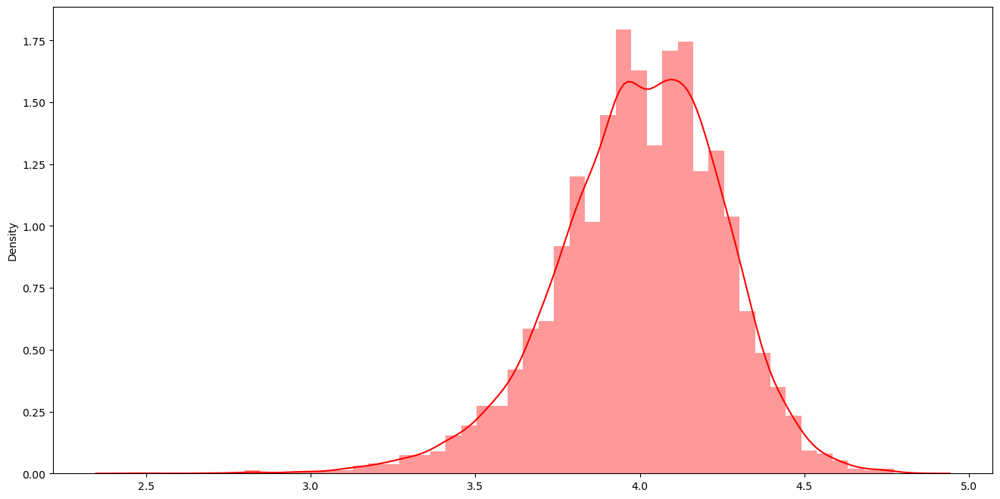

In [47]:
plt.figure(figsize=(16,8))
sns.distplot(x=books['average_rating'], kde=True, color='r')

In [50]:
ratings

,book_id,user_id,rating
117889,1180,1,4
488112,4893,1,3
625717,6285,1,4
796318,8034,2,4
875008,8855,2,5
...,...,...,...
912886,9255,53424,4
818162,8262,53424,4
777143,7833,53424,4
716608,7212,53424,4


In [48]:
no_of_ratings_per_book=ratings.groupby('book_id').count()

In [49]:
no_of_ratings_per_book

,user_id,rating
book_id,,
1,100,100
2,100,100
3,100,100
4,100,100
5,100,100
...,...,...
9996,96,96
9997,89,89
9998,95,95


C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

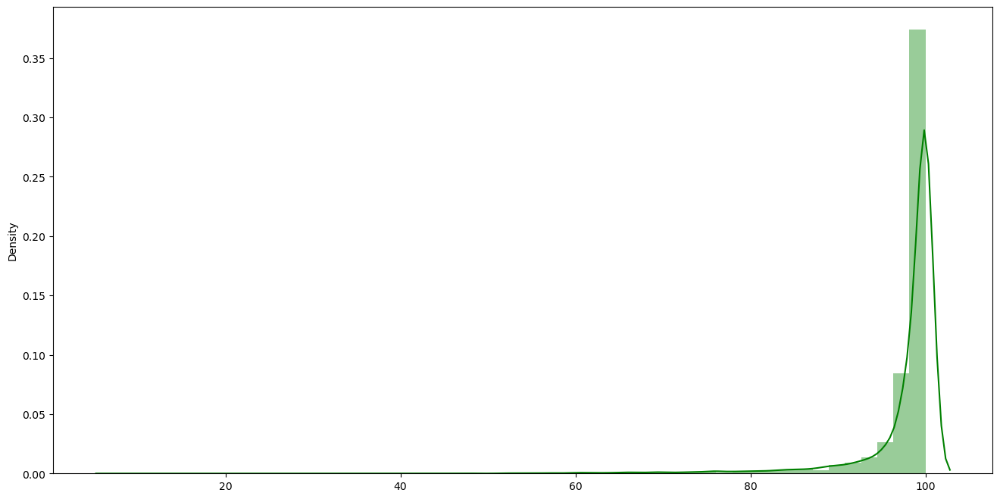

In [51]:
# It is seen that most books have count of ratings greater than 80.
# 대다수의 책들의 ratings 갯수가 80개 이상
plt.figure(figsize=(16,8))
sns.distplot(x=no_of_ratings_per_book['rating'], color='g')

### Highly rated authors

In [52]:
books.head(2)

,id,book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,...,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
0,1,2767052,2767052,2792775,272,439023483,9.780439e+12,Suzanne Collins,2008.0,The Hunger Games,...,4780653,4942365,155254,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603m...,https://images.gr-assets.com/books/1447303603s...
1,2,3,3,4640799,491,439554934,9.780440e+12,"J.K. Rowling, Mary GrandPré",1997.0,Harry Potter and the Philosopher's Stone,...,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m...,https://images.gr-assets.com/books/1474154022s...


In [53]:
f=['authors', 'average_rating']
top_authors=top_rated[f]
top_authors=top_authors.head(20)

In [60]:
top_authors

,authors,average_rating
3627,Bill Watterson,4.82
861,Brandon Sanderson,4.77
8853,Francine Rivers,4.76
4482,Bill Watterson,4.75
6360,Bill Watterson,4.74
421,J.K. Rowling,4.74
3752,J.K. Rowling,4.73
6919,Bill Watterson,4.73
6589,Bill Watterson,4.73
9565,Bill Watterson,4.72


In [56]:
# Bill Waterson is on the top with a whopping rating of 4.82!
fig = px.bar(top_authors, x='authors', y='average_rating', color ='average_rating')
fig.show()

### popular genres

In [61]:
joint_tags

,goodreads_book_id,tag_id,count,tag_name
0,1,30574,167697,to-read
1,2,30574,24549,to-read
2,3,30574,496107,to-read
3,5,30574,11909,to-read
4,6,30574,298,to-read
...,...,...,...,...
999891,31538635,14690,6,hogwarts
999892,32848471,16149,21,jan-2017
999893,33288638,27821,9,single-mom
999894,33288638,11478,7,fave-author


In [62]:
p=joint_tags.groupby('tag_name').count()

In [63]:
p=p.sort_values(by='count', ascending=False)
p

,goodreads_book_id,tag_id,count
tag_name,,,
to-read,9983,9983,9983
favorites,9881,9881,9881
owned,9856,9856,9856
books-i-own,9799,9799,9799
currently-reading,9776,9776,9776
...,...,...,...
hs,1,1,1
hrabal,1,1,1
hq-manga,1,1,1


In [99]:
pd.set_option('display.max_columns', None)

In [101]:
pd.set_option('display.max_rows', None)

In [102]:
p

,goodreads_book_id,tag_id,count
tag_name,,,
to-read,9983,9983,9983
favorites,9881,9881,9881
owned,9856,9856,9856
books-i-own,9799,9799,9799
currently-reading,9776,9776,9776
library,9415,9415,9415
owned-books,9221,9221,9221
fiction,9097,9097,9097
to-buy,8692,8692,8692


### genres 하드코딩

In [67]:
genres=["Art", "Biography", "Business", "Chick Lit", "Children's", 
        "Christian", "Classics", "Comics", "Contemporary", "Cookbooks", 
        "Crime", "Ebooks", "Fantasy", "Fiction", "Gay and Lesbian", 
        "Graphic Novels", "Historical Fiction", "History", "Horror", 
        "Humor and Comedy", "Manga", "Memoir", "Music", "Mystery", 
        "Nonfiction", "Paranormal", "Philosophy", "Poetry", "Psychology", 
        "Religion", "Romance", "Science", "Science Fiction", "Self Help", 
        "Suspense", "Spirituality", "Sports", "Thriller", "Travel", "Young Adult"]
for i in range(len(genres)):
    genres[i]=genres[i].lower()

In [68]:
new_tags=p[p.index.isin(genres)]

In [69]:
new_tags

,goodreads_book_id,tag_id,count
tag_name,,,
fiction,9097,9097,9097
ebooks,7203,7203,7203
contemporary,5287,5287,5287
fantasy,4259,4259,4259
romance,4251,4251,4251
mystery,3686,3686,3686
classics,2785,2785,2785
thriller,2522,2522,2522
suspense,2419,2419,2419


In [70]:
import plotly.graph_objects as go

fig = go.Figure(go.Bar(
            x=new_tags['count'],
            y=new_tags.index,
            orientation='h'))

fig.show()

### no of editions and ratings 의 관계
Weirdly, it is seen that the average_rating increases with increases in number of editions of the book, but decreases after the count reaches about 2500. So, more is the number of editions, less is the average_rating.

In [71]:
fig = px.line(books, y="books_count", x="average_rating", title='Book Count VS Average Rating')
fig.show()

In [73]:
dropna

,id,book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,...,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
0,1,2767052,2767052,2792775,272,439023483,9.780439e+12,Suzanne Collins,2008.0,The Hunger Games,...,4780653,4942365,155254,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603m...,https://images.gr-assets.com/books/1447303603s...
1,2,3,3,4640799,491,439554934,9.780440e+12,"J.K. Rowling, Mary GrandPré",1997.0,Harry Potter and the Philosopher's Stone,...,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m...,https://images.gr-assets.com/books/1474154022s...
3,4,2657,2657,3275794,487,61120081,9.780061e+12,Harper Lee,1960.0,To Kill a Mockingbird,...,3198671,3340896,72586,60427,117415,446835,1001952,1714267,https://images.gr-assets.com/books/1361975680m...,https://images.gr-assets.com/books/1361975680s...
4,5,4671,4671,245494,1356,743273567,9.780743e+12,F. Scott Fitzgerald,1925.0,The Great Gatsby,...,2683664,2773745,51992,86236,197621,606158,936012,947718,https://images.gr-assets.com/books/1490528560m...,https://images.gr-assets.com/books/1490528560s...
5,6,11870085,11870085,16827462,226,525478817,9.780525e+12,John Green,2012.0,The Fault in Our Stars,...,2346404,2478609,140739,47994,92723,327550,698471,1311871,https://images.gr-assets.com/books/1360206420m...,https://images.gr-assets.com/books/1360206420s...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,9995,15613,15613,2764239,199,1416523723,9.781417e+12,Herman Melville,1924.0,"Billy Budd, Sailor",...,10866,12110,681,1478,2225,3805,2985,1617,https://s.gr-assets.com/assets/nophoto/book/11...,https://s.gr-assets.com/assets/nophoto/book/50...
9995,9996,7130616,7130616,7392860,19,441019455,9.780441e+12,Ilona Andrews,2010.0,Bayou Moon,...,17204,18856,1180,105,575,3538,7860,6778,https://images.gr-assets.com/books/1307445460m...,https://images.gr-assets.com/books/1307445460s...
9996,9997,208324,208324,1084709,19,067973371X,9.780680e+12,Robert A. Caro,1990.0,Means of Ascent,...,12582,12952,395,303,551,1737,3389,6972,https://s.gr-assets.com/assets/nophoto/book/11...,https://s.gr-assets.com/assets/nophoto/book/50...
9997,9998,77431,77431,2393986,60,039330762X,9.780393e+12,Patrick O'Brian,1977.0,The Mauritius Command,...,9421,10733,374,11,111,1191,4240,5180,https://images.gr-assets.com/books/1455373531m...,https://images.gr-assets.com/books/1455373531s...


In [72]:
# 2011년도에 출간된 책이 많음. 언어는 English
dropna= books.dropna()
fig = px.treemap(dropna, path=['original_publication_year','language_code', "average_rating"],
                  color='average_rating')
fig.show()

### titles 의 길이
highly rated books have rather short titles. The graph shows that a straight line can be plotted but very approximately to say that as the length of title increases, the rating remains constant(at around 4)
- 평점이 높은 책들은 상대적으로 짧은 길이의 제목??

In [74]:
books['length-title']=books['original_title'].str.len()

<AxesSubplot:xlabel='length-title', ylabel='average_rating'>

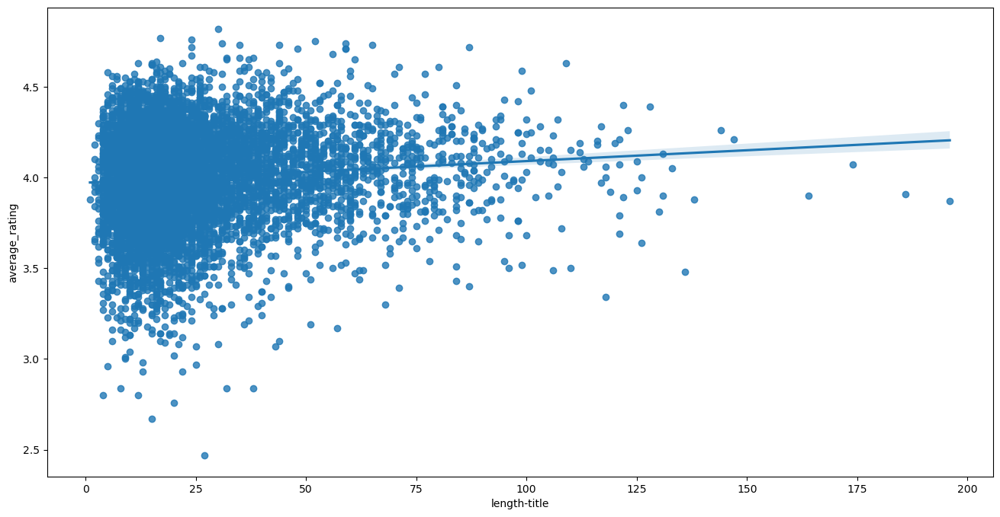

In [75]:
plt.figure(figsize=(16,8))
sns.regplot(x=books['length-title'], y=books['average_rating'])

### 워드 클라우드

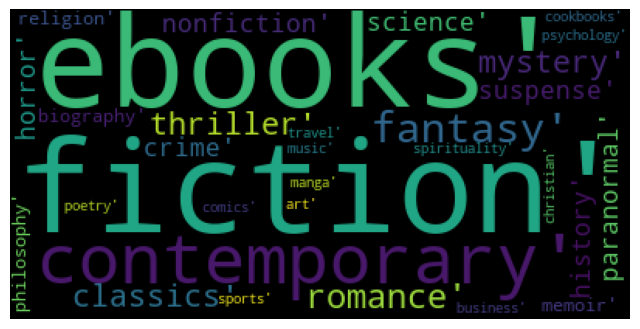

In [76]:
from wordcloud import WordCloud, STOPWORDS 
text = new_tags.index.values 

wordcloud = WordCloud().generate(str(text))
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [77]:
books.columns

Index(['id', 'book_id', 'best_book_id', 'work_id', 'books_count', 'isbn',
       'isbn13', 'authors', 'original_publication_year', 'original_title',
       'title', 'language_code', 'average_rating', 'ratings_count',
       'work_ratings_count', 'work_text_reviews_count', 'ratings_1',
       'ratings_2', 'ratings_3', 'ratings_4', 'ratings_5', 'image_url',
       'small_image_url', 'length-title'],
      dtype='object')

In [78]:
to_read=pd.read_csv("data/to_read.csv")
to_r= books.merge(to_read, left_on='book_id', right_on='book_id', how='inner')

In [80]:
to_r=to_r.groupby('original_title').count()

In [81]:
to_r=to_r.sort_values(by='id', ascending=False)
to_r20=to_r.head(20)

### Top Books users want to read

In [82]:
fig = px.bar(to_r20, x=to_r20.index, y='id', color ='id')
fig.show()

## Recommendation System
recommendation system 의 두 가지 타입
- Content Based : This approach analyzes the available content and find similarities between them and then recommendations the items obtained that have a high similarity.
- Collaborative : This approach mines or analyzes the information about users who prefer the same content and recommend the items that similar users prefer.

------------------------------
------------------------------
(출처 : https://lsjsj92.tistory.com/563)
초반에는 콘텐츠 기반 필터링을 많이 사용했지만, 넷플릭스의 사례 이후 협업 필터링, 그 중 latent factor(잠재 요인) 협업 필터링을 많이 사용하게 되었다.
- 컨텐츠 기반 필터링
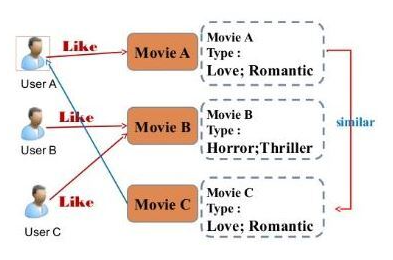
- 협력 필터링 : 최근접 이웃 기반, 잠재요인 협업 필터링. 사용자가 아이템에 매긴 평점, 상품 구매 이력 등의 사용자 행동 양식을 기반으로 추천해주는 것. 최근접 이웃 기반은 사용자-아이템 행렬에서 사용자가 아직 평가하지 않은 아이템을 예측하는 것이 목표
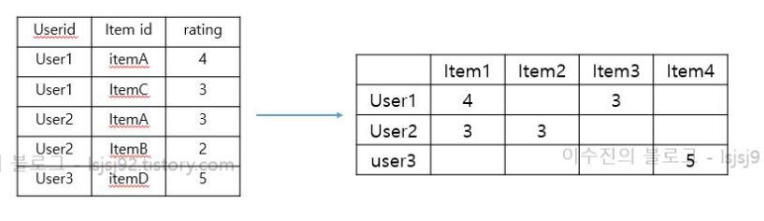

### Content Based
title, authors, average rating 요인에 따라 필터링

In [83]:
fillnabooks= books.fillna('')

In [84]:
# 전처리 : 소문자로
def clean_data(x):
        return str.lower(x.replace(" ", ""))

In [85]:
features=['original_title','authors','average_rating']
fillednabooks=fillnabooks[features]

In [86]:
fillednabooks = fillednabooks.astype(str)
fillednabooks.dtypes

original_title    object
authors           object
average_rating    object
dtype: object

In [87]:
for feature in features:
    fillednabooks[feature] = fillednabooks[feature].apply(clean_data)
    
fillednabooks.head(2)

,original_title,authors,average_rating
0,thehungergames,suzannecollins,4.34
1,harrypotterandthephilosopher'sstone,"j.k.rowling,marygrandpré",4.44


In [88]:
# Creating a "soup" or a "bag of words" for all rows.
def create_soup(x):
    return x['original_title']+ ' ' + x['authors'] + ' ' + x['average_rating']

In [89]:
fillednabooks['soup'] = fillednabooks.apply(create_soup, axis=1)

In [90]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(fillednabooks['soup'])

cosine_sim2 = cosine_similarity(count_matrix, count_matrix)

In [91]:
fillednabooks=fillednabooks.reset_index()
indices = pd.Series(fillednabooks.index, index=fillednabooks['original_title'])

In [93]:
def get_recommendations_new(title, cosine_sim=cosine_sim2):
    title=title.replace(' ','').lower()
    idx = indices[title]

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return list(books['original_title'].iloc[movie_indices])

In [94]:
l=get_recommendations_new('The Hobbit', cosine_sim2)
fig = go.Figure(data=[go.Table(header=dict(values=l,fill_color='orange'))])
fig.show()